# Import & Data check

### - 필요한 패키지와 라이브러리 로드

In [1]:
!pip install -q langdetect
!pip install -q textstat

In [2]:
import numpy as np
import pandas as pd

# 최대 줄, 열, 너비 설정 - 데이터 출력시 모두 보이게 출력하기 위함
pd.set_option('display.max_rows', 100)
pd.set_option('display.max_columns', 100)
pd.set_option('display.width', 1000)

from collections import defaultdict,Counter
from multiprocessing import Pool

# 텍스트 analysis Tool
# nltk는 자연어 처리 패키지(분류, 토큰, 형태소 분석, 태깅, 구문 분석등에 활용)
import textstat
from statistics import *

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.figure_factory as ff
import plotly.express as px
import plotly.offline as py

from sklearn.feature_extraction.text import CountVectorizer
from nltk.stem import WordNetLemmatizer, PorterStemmer
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

from langdetect import detect

from wordcloud import WordCloud, STOPWORDS

from scipy.stats import norm, kurtosis, skew

# 즉석에서 Progress var 생성해주는 패키지
from tqdm import tqdm
tqdm.pandas() # 초기화

import string, json, nltk, gc

In [3]:
# 불용어 로드(I, my, me, over, 조사, 접미사 등과 같은 단어)
nltk.download('stopwords')
stop = set(stopwords.words('english'))
plt.style.use('seaborn')

nltk.download('punkt')
nltk.download('wordnet')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\82102\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\82102\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\82102\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

### - 데이터 확인

In [4]:
TRAIN_UNINTENDED_BIAS = "jigsaw-unintended-bias-train.csv"
TRAIN_TOXICITY = "jigsaw-toxic-comment-train.csv"

VALIDATION = "validation.csv"

TEST = "test.csv"

In [5]:
train_1_df = pd.read_csv(TRAIN_UNINTENDED_BIAS)
train_2_df = pd.read_csv(TRAIN_TOXICITY)

validation_df = pd.read_csv(VALIDATION)

test_df = pd.read_csv(TEST)

In [7]:
train_1_df.head()

,id,comment_text,toxic,severe_toxicity,obscene,identity_attack,insult,threat,asian,atheist,bisexual,black,buddhist,christian,female,heterosexual,hindu,homosexual_gay_or_lesbian,intellectual_or_learning_disability,jewish,latino,male,muslim,other_disability,other_gender,other_race_or_ethnicity,other_religion,other_sexual_orientation,physical_disability,psychiatric_or_mental_illness,transgender,white,created_date,publication_id,parent_id,article_id,rating,funny,wow,sad,likes,disagree,sexual_explicit,identity_annotator_count,toxicity_annotator_count
0,59848,"This is so cool. It's like, 'would you want yo...",0.000000,0.000000,0.0,0.000000,0.00000,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2015-09-29 10:50:41.987077+00,2,NaN,2006,rejected,0,0,0,0,0,0.0,0,4
1,59849,Thank you!! This would make my life a lot less...,0.000000,0.000000,0.0,0.000000,0.00000,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2015-09-29 10:50:42.870083+00,2,NaN,2006,rejected,0,0,0,0,0,0.0,0,4
2,59852,This is such an urgent design problem; kudos t...,0.000000,0.000000,0.0,0.000000,0.00000,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2015-09-29 10:50:45.222647+00,2,NaN,2006,rejected,0,0,0,0,0,0.0,0,4
3,59855,Is this something I'll be able to install on m...,0.000000,0.000000,0.0,0.000000,0.00000,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2015-09-29 10:50:47.601894+00,2,NaN,2006,rejected,0,0,0,0,0,0.0,0,4
4,59856,haha you guys are a bunch of losers.,0.893617,0.021277,0.0,0.021277,0.87234,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.25,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2015-09-29 10:50:48.488476+00,2,NaN,2006,rejected,0,0,0,1,0,0.0,4,47


In [8]:
train_2_df.head()

,id,comment_text,toxic,severe_toxic,obscene,threat,insult,identity_hate
0,0000997932d777bf,Explanation\nWhy the edits made under my usern...,0,0,0,0,0,0
1,000103f0d9cfb60f,D'aww! He matches this background colour I'm s...,0,0,0,0,0,0
2,000113f07ec002fd,"Hey man, I'm really not trying to edit war. It...",0,0,0,0,0,0
3,0001b41b1c6bb37e,"""\nMore\nI can't make any real suggestions on ...",0,0,0,0,0,0
4,0001d958c54c6e35,"You, sir, are my hero. Any chance you remember...",0,0,0,0,0,0


In [9]:
validation_df.head()

,id,comment_text,lang,toxic
0,0,Este usuario ni siquiera llega al rango de ...,es,0
1,1,Il testo di questa voce pare esser scopiazzato...,it,0
2,2,Vale. Sólo expongo mi pasado. Todo tiempo pasa...,es,1
3,3,Bu maddenin alt başlığı olarak uluslararası i...,tr,0
4,4,Belçika nın şehirlerinin yanında ilçe ve belde...,tr,0


In [10]:
test_df.head()

,id,content,lang
0,0,Doctor Who adlı viki başlığına 12. doctor olar...,tr
1,1,"Вполне возможно, но я пока не вижу необходимо...",ru
2,2,"Quindi tu sei uno di quelli conservativi , ...",it
3,3,Malesef gerçekleştirilmedi ancak şöyle bir şey...,tr
4,4,:Resim:Seldabagcan.jpg resminde kaynak sorunu ...,tr


In [11]:
train_1_df.shape, train_2_df.shape, validation_df.shape, test_df.shape

((1902194, 45), (223549, 8), (8000, 4), (63812, 3))

# EDA

## - Toxicity distribution
데이터 셋에서 Toxicity와 Validation의 toxic값은 0과 1로만 나타나는 것을 볼 수 있지만, Unintended bias 데이터셋은 연속적인 값을 가짐 

따라서 데이터타입을 다 int 형으로 맞춰주어 Unintended bias 데이터의 toxic값이 0.5 이상이면 1, 그 미만이면 0 으로 설정하도록 함

C:\Users\82102\Anaconda3\envs\py36\lib\site-packages\ipykernel_launcher.py:15: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



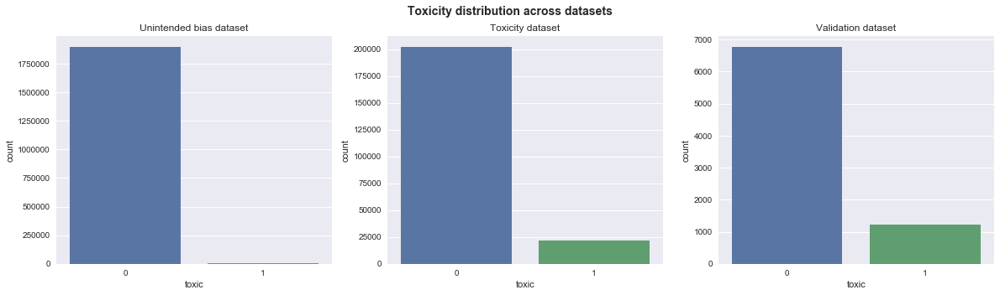

In [12]:
# 1행 3열로 그래프 그림
fig, ax = plt.subplots(1, 3, figsize=(20, 5))

sns.countplot(train_1_df['toxic'].astype(int), ax=ax[0])
ax[0].set_title('Unintended bias dataset')

sns.countplot(train_2_df['toxic'].astype(int), ax=ax[1])
ax[1].set_title('Toxicity dataset')

sns.countplot(validation_df['toxic'].astype(int), ax=ax[2])
ax[2].set_title('Validation dataset')

fig.suptitle('Toxicity distribution across datasets', fontweight='bold', fontsize=14)

fig.show()

불균형적인 데이터셋 결과를 볼 수 있음

## - Language distribution

C:\Users\82102\Anaconda3\envs\py36\lib\site-packages\ipykernel_launcher.py:10: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



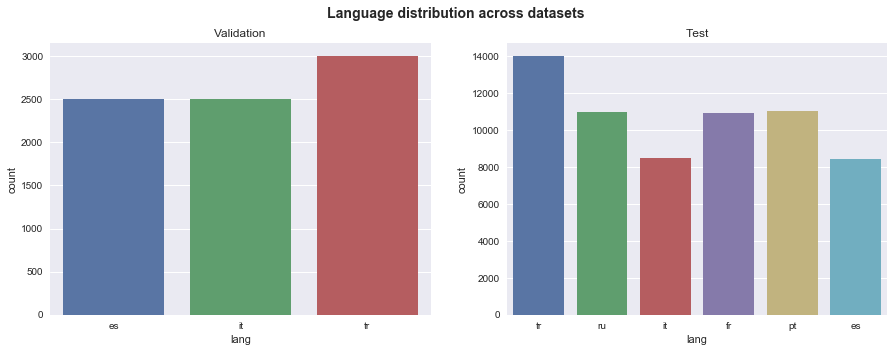

In [13]:
fig, ax = plt.subplots(1, 2, figsize=(15, 5))

sns.countplot(validation_df['lang'], ax=ax[0])
ax[0].set_title('Validation')

sns.countplot(test_df['lang'], ax=ax[1])
ax[1].set_title('Test')

fig.suptitle('Language distribution across datasets', fontweight="bold", fontsize=14)
fig.show()

그래프의 결과를 보면, validation 데이터셋은 test 데이터셋에 있는 6개의 언어를 다 포함하고 있지 않은 것을 알 수 있음



따라서 validation 데이터셋을 세분화하여 French, Portuguese, Russian 항목을 추가하여 할 것

## - Length distribution

< Unintended bias dataset >

C:\Users\82102\Anaconda3\envs\py36\lib\site-packages\ipykernel_launcher.py:6: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



Text(0.5, 0.98, 'Distribution of number of No: Characters in Comments - Unintended bias dataset')

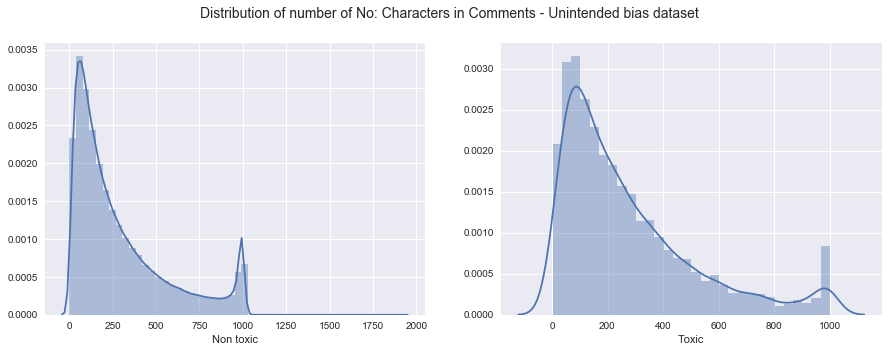

In [14]:
fig, ax = plt.subplots(1,2, figsize=(15, 5))

sns.distplot(train_1_df[train_1_df['toxic']==0]['comment_text'].str.len(), axlabel="Non toxic", ax=ax[0])
sns.distplot(train_1_df[train_1_df['toxic']==1]['comment_text'].str.len(), axlabel="Toxic", ax=ax[1])

fig.show()

fig.suptitle("Distribution of number of No: Characters in Comments - Unintended bias dataset", fontsize=14)

< Toxicity dataset >

C:\Users\82102\Anaconda3\envs\py36\lib\site-packages\ipykernel_launcher.py:6: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



Text(0.5, 0.98, 'Distribution of number of No: Characters in Comments - Toxicity dataset')

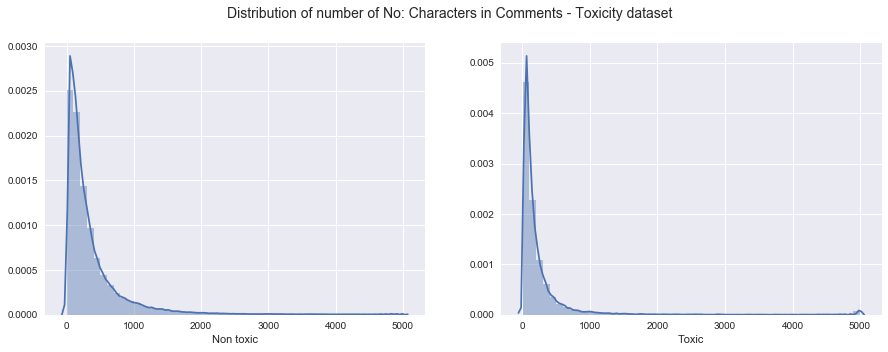

In [15]:
fig, ax = plt.subplots(1,2, figsize=(15, 5))

sns.distplot(train_2_df[train_2_df['toxic']==0]['comment_text'].str.len(), axlabel="Non toxic", ax=ax[0])
sns.distplot(train_2_df[train_2_df['toxic']==1]['comment_text'].str.len(), axlabel="Toxic", ax=ax[1])

fig.show()

fig.suptitle("Distribution of number of No: Characters in Comments - Toxicity dataset", fontsize=14)

상대적으로 toxicity 데이터 셋에서 문자의 개수가 적은 것을 볼 수 있음

### 각각의 데이터 셋에서 문자의 개수가 많은 부분의 데이터를 보면,

In [16]:
train_1_df[train_1_df['comment_text'].str.len() > 850][['comment_text', 'toxic']].sample(n=100).reset_index(drop=True)

,comment_text,toxic
0,"No trainer, private, LEO, or military, teaches...",0.166667
1,I'm definitely not opposed to cutting welfare ...,0.000000
2,"Unto the students, unto the teachers, and unto...",0.500000
3,This is a shameful display by these rural legi...,0.000000
4,If you have ever seen anyone that truly suffer...,0.166667
5,Not bad but the government is planning on at l...,0.000000
6,"Ah, if I only had a dollar for every time some...",0.300000
7,"Tell the whole story, background, mental disab...",0.000000
8,"""When will survivors come first?""\n\n===\n\nIt...",0.000000
9,So where do we go from here W077? More of the ...,0.000000


In [17]:
train_2_df[train_2_df['comment_text'].str.len() > 2000][["comment_text", "toxic"]].sample(n=100).reset_index(drop=True)

,comment_text,toxic
0,"""What I was saying was that South Africa was n...",0
1,""" \n\n ==Copyright problem: Craig B. Thompson=...",0
2,""" \n\n == GOCE mid-December newsletter == \n {...",0
3,""" \n\n This is (in chart form) what I had sugg...",0
4,""":I have been through this article many times ...",0
5,""" \nOMG \nOMG \nOMG \nOMG \nOMG \nOMG \nOMG \n...",0
6,"""\n\nJFW's statements are in italics below:\n\...",0
7,"""\n\nThere is only one verified fact of applic...",0
8,"""\n\n vague point \nwould it help to rephrase ...",0
9,== leave me alone!!!! i did nothing to you == ...,0


- 데이터를 보니 "\n"와 같은 문장부호 때문에 제대로 분류되지 않은 것을 알 수 있음 
- unintended bias 데이터셋의 comment가 toxicity 데이터셋보다 상대적으로 더 잘 분류되어 있음 (부호의 오류나 특정 이상한 태그가 보이지 않음)
- 어떤 comment에서는 반복적인 욕이 나타나는 것이 보임


### validation과 test 데이터셋의 텍스트가 어떻게 포맷되었는지 확인해보면,

C:\Users\82102\Anaconda3\envs\py36\lib\site-packages\ipykernel_launcher.py:7: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



Text(0.5, 0.98, 'Distribution of number of No: Characters in Comments - Toxicity dataset')

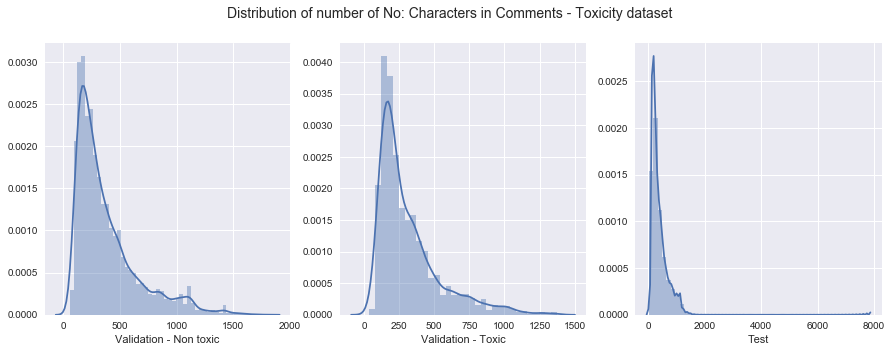

In [18]:
fig, ax = plt.subplots(1,3, figsize=(15, 5))

sns.distplot(validation_df[validation_df['toxic']==0]['comment_text'].str.len(), axlabel="Validation - Non toxic", ax=ax[0])
sns.distplot(validation_df[validation_df['toxic']==1]['comment_text'].str.len(), axlabel="Validation - Toxic", ax=ax[1])
sns.distplot(test_df['content'].str.len(), axlabel="Test", ax=ax[2])

fig.show()

fig.suptitle("Distribution of number of No: Characters in Comments - Toxicity dataset", fontsize=14)

In [19]:
validation_df[validation_df['comment_text'].str.len() > 1000][["comment_text", 'lang', "toxic"]].sample(n=100).reset_index(drop=True)

,comment_text,lang,toxic
0,"Ciao, I tecnici della Wikimedia Foundation sta...",it,0
1,"Hoş Geldin ! Merhaba, tamamen gönüllü ka...",tr,0
2,In questa visione la masturbazione è un esp...,it,0
3,"lunedì, 29 marzo 2010 ho modificato un url di ...",it,0
4,"Merhaba Sarv, Özdemir Sökmen sayfasını açmışsı...",tr,0
5,"Ciao, I tecnici della Wikimedia Foundation sta...",it,0
6,"Maddelerde değişiklik yaparken, lütfen tara...",tr,0
7,Merhaba. Kasım 2015 Türkiye genel seçimleri sa...,tr,0
8,è colpa di m7 perchè quel bastardo schifoso pr...,it,1
9,"Maddelerde değişiklik yaparken, lütfen tara...",tr,0


In [20]:
test_df[test_df['content'].str.len() > 1000][["content", 'lang']].sample(n=100).reset_index(drop=True)

,content,lang
0,"Merhaba, Günün seçkin resmi ni tanımlayan Bi...",tr
1,Je n ai pas vraiment d explication à ca. Plut...,fr
2,Вы невнимательны. Посмотрите на следующую стр...,ru
3,"left|25px|alt= Olá, e bem-vindo à Wikipédia. T...",pt
4,Ещё раз добрый день! Прочитал Вашу рецензию на...,ru
5,"Öncelikle madde kaynaksız, kaynaklandırılmalı....",tr
6,"Спасибо, что вы сделали свой вклад в статью Th...",ru
7,Morvan Marchal est tout d abord cité pour avoi...,fr
8,"Bem-vindo(a), DAVI AMERICI! Seu trabalho...",pt
9,"esquerda|50px Caro usuário, nunca copie par...",pt



validation과 test의 데이터셋은 toxicity의 데이터셋보다 훨씬 잘 포맷된 것으로 보임


    unintended bias 데이터셋에서 따로 처리해줄 것은 없을것 같음


    반면에 toxicity 데이터셋에서는 "\n"과 같은 문장부호 및 다른 태그들을 처리해주어야 할 필요가 있음 (validation과 test의 데이터셋의 분포와 비슷하게 만들기 위함)




### 언어와 코멘트 길이 사이의 관계를 살펴보면,

C:\Users\82102\Anaconda3\envs\py36\lib\site-packages\ipykernel_launcher.py:12: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



Text(0.5, 0.98, 'Distribution of # of characters for each language')

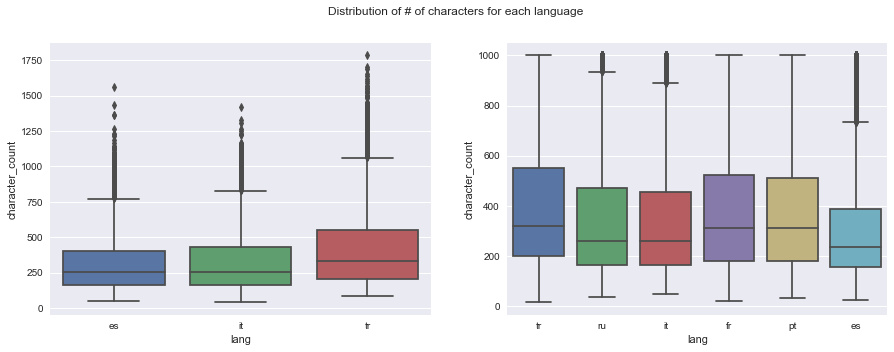

In [21]:
fig, ax = plt.subplots(1, 2, figsize=(15, 5))

# "character_count" 칼럼 생성하여 'comment_text'의 길이값 대입
validation_df["character_count"] = validation_df['comment_text'].apply(lambda x: len(x))
test_df['character_count'] = test_df['content'].apply(lambda x: len(x))

test_df['character_count'] = test_df['character_count'].apply(lambda x: 1000 if x > 1000 else x) # Nicer formatting 

sns.boxplot('lang', 'character_count', data=validation_df, ax=ax[0])
sns.boxplot('lang', 'character_count', data=test_df, ax=ax[1])

fig.show()

fig.suptitle('Distribution of # of characters for each language')

터키어의 comment 길이가 다른 언어보다 상대적으로 길이가 긴 반면에, 스페인어 comment 길이는 더 짧은 것을 알 수 있음

→ 이러한 특성을 통해 모델을 돌릴때 meta-feature 생성 가능 ( characterize the complexity of datasets and to provide estimates of algorithm performance )


## - Word distribution

C:\Users\82102\Anaconda3\envs\py36\lib\site-packages\ipykernel_launcher.py:7: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



Text(0.5, 0.98, 'Distribution of number of No: Words in Comments - Unintended bias')

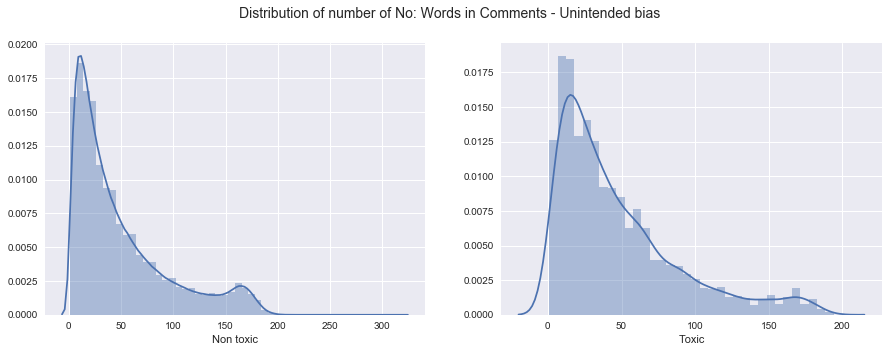

In [22]:
fig, ax = plt.subplots(1,2, figsize=(15, 5))

# split() 사용해 스페이스 기준으로 'comment_text'의 문자열을 잘라 그 개수를 x축 값으로 설정
sns.distplot(train_1_df[train_1_df['toxic']==0]['comment_text'].str.split().str.len(), axlabel="Non toxic", ax=ax[0])
sns.distplot(train_1_df[train_1_df['toxic']==1]['comment_text'].str.split().str.len(), axlabel="Toxic", ax=ax[1])

fig.show()

fig.suptitle("Distribution of number of No: Words in Comments - Unintended bias", fontsize=14)

C:\Users\82102\Anaconda3\envs\py36\lib\site-packages\ipykernel_launcher.py:6: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



Text(0.5, 0.98, 'Distribution of number of No: Words in Comments - Toxicity')

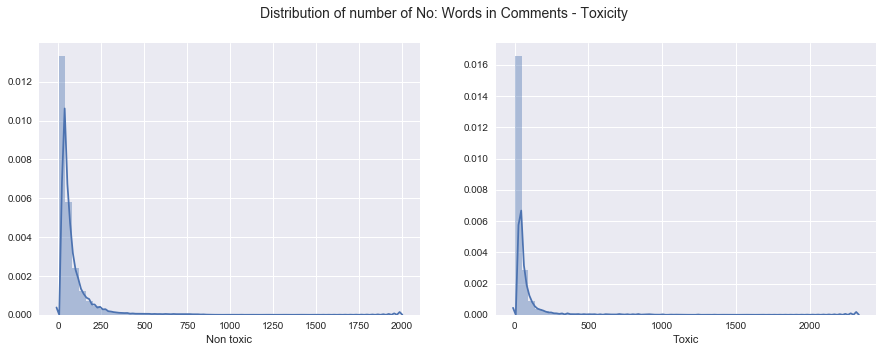

In [23]:
fig, ax = plt.subplots(1,2, figsize=(15, 5))

sns.distplot(train_2_df[train_2_df['toxic']==0]['comment_text'].str.split().str.len(), axlabel="Non toxic", ax=ax[0])
sns.distplot(train_2_df[train_2_df['toxic']==1]['comment_text'].str.split().str.len(), axlabel="Toxic", ax=ax[1])

fig.show()

fig.suptitle("Distribution of number of No: Words in Comments - Toxicity", fontsize=14)

toxicity 데이터 셋에서 단어 개수가 극단적으로 많은 데이터가 있는 것이 보임

### < Dataframe에 column 추가 >
Dataframe에 단어 개수, 문자 개수, 불용어 개수, 구두점 개수, 대문자인 단어 개수, 단어의 평균 개수 등의 column을 추가하는 함수를 선언

In [24]:
def whisker_plot_stats(train):
    ## 단어의 개수 - 스페이스 기준으로 'comment_text'의 문자열을 잘라 그 개수를 대입
    train["num_words"] = train["comment_text"].progress_apply(lambda x: len(str(x).split()))

    ## 특정한 단어의 개수 - 스페이스 기준으로 'comment_text'의 문자열을 잘라 집합으로 만들고, 그 개수를 대입
    train["num_unique_words"] = train["comment_text"].progress_apply(lambda x: len(set(str(x).split())))

    ## 문자의 개수 - 'comment_text'의 문자 개수를 대입
    train["num_chars"] = train["comment_text"].progress_apply(lambda x: len(str(x)))

    ## 불용어의 개수 - 'comment_text'에 있는 단어를 모두 소문자로 바꾸어 그중에 불용어가 있을 시, 그 개수를 대입
    ## lower() - 단어를 모두 소문자로 바꾸는 함수
    train["num_stopwords"] = train["comment_text"].progress_apply(lambda x: len([w for w in str(x).lower().split() if w in STOPWORDS]))

    ## 구두점의 개수 - 'comment_text'의 문자에 있는 구두점의 개수를 대입
    train["num_punctuations"] =train['comment_text'].progress_apply(lambda x: len([c for c in str(x) if c in string.punctuation]) )

    ## 대문자 단어의 개수 
    ## isupper() - 단어의 첫문자가 대문자인지 확인해주는 함수
    train["num_words_upper"] = train["comment_text"].progress_apply(lambda x: len([w for w in str(x).split() if w.isupper()]))
    
    # 대문자 단어 개수
    # istitle() - 단어마다 첫글자가 대문자인지 확인해주는 함수
    train["num_words_title"] = train["comment_text"].progress_apply(lambda x: len([w for w in str(x).split() if w.istitle()]))

    # 단어의 평균 개수
    train["mean_word_len"] = train["comment_text"].progress_apply(lambda x: np.mean([len(w) for w in str(x).split()]))
    
    return train


In [25]:
print('Train 1...')
train_1_df = whisker_plot_stats(train_1_df)
print('Train 2...')
train_2_df = whisker_plot_stats(train_2_df)

  0%|                                                                           | 1/1902194 [00:00<58:14:51,  9.07it/s]

Train 1...


  4%|███                                                                      | 9332/223549 [00:00<00:02, 93111.41it/s]

Train 2...


100%|███████████████████████████████████████████████████████████████████████| 223549/223549 [00:09<00:00, 24451.05it/s]


In [26]:
train_1_df.head()

,id,comment_text,toxic,severe_toxicity,obscene,identity_attack,insult,threat,asian,atheist,bisexual,black,buddhist,christian,female,heterosexual,hindu,homosexual_gay_or_lesbian,intellectual_or_learning_disability,jewish,latino,male,muslim,other_disability,other_gender,other_race_or_ethnicity,other_religion,other_sexual_orientation,physical_disability,psychiatric_or_mental_illness,transgender,white,created_date,publication_id,parent_id,article_id,rating,funny,wow,sad,likes,disagree,sexual_explicit,identity_annotator_count,toxicity_annotator_count,num_words,num_unique_words,num_chars,num_stopwords,num_punctuations,num_words_upper,num_words_title,mean_word_len
0,59848,"This is so cool. It's like, 'would you want yo...",0.000000,0.000000,0.0,0.000000,0.00000,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2015-09-29 10:50:41.987077+00,2,NaN,2006,rejected,0,0,0,0,0,0.0,0,4,19,19,101,7,9,0,2,4.368421
1,59849,Thank you!! This would make my life a lot less...,0.000000,0.000000,0.0,0.000000,0.00000,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2015-09-29 10:50:42.870083+00,2,NaN,2006,rejected,0,0,0,0,0,0.0,0,4,22,22,114,10,7,0,3,4.227273
2,59852,This is such an urgent design problem; kudos t...,0.000000,0.000000,0.0,0.000000,0.00000,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2015-09-29 10:50:45.222647+00,2,NaN,2006,rejected,0,0,0,0,0,0.0,0,4,16,16,86,9,3,0,2,4.437500
3,59855,Is this something I'll be able to install on m...,0.000000,0.000000,0.0,0.000000,0.00000,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2015-09-29 10:50:47.601894+00,2,NaN,2006,rejected,0,0,0,0,0,0.0,0,4,17,16,84,10,3,0,2,4.000000
4,59856,haha you guys are a bunch of losers.,0.893617,0.021277,0.0,0.021277,0.87234,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.25,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2015-09-29 10:50:48.488476+00,2,NaN,2006,rejected,0,0,0,1,0,0.0,4,47,8,8,36,4,1,0,0,3.625000


### < 단어 개수의 분포 >

C:\Users\82102\Anaconda3\envs\py36\lib\site-packages\ipykernel_launcher.py:25: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



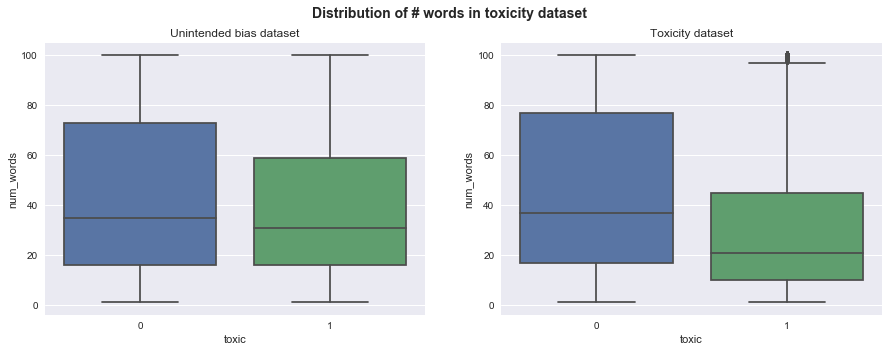

In [27]:
# 'num_words'(단어의 개수)가 100이 넘는 경우 그 값을 100으로 대체
# 'num_punctuations'(구두점 개수)가 10이 넘는 경우 그 값을 10으로 대체
# 'num_chars'(문자 개수)가 350이 넘는 경우 그 값을 350으로 대체

train_1_df['num_words'].loc[train_1_df['num_words']>100] = 100
train_1_df['num_punctuations'].loc[train_1_df['num_punctuations']>10] = 10 
train_1_df['num_chars'].loc[train_1_df['num_chars']>350] = 350 
train_1_df['toxic'] = train_1_df['toxic'].apply(lambda x: 1 if x > 0.5 else 0)

train_2_df['num_words'].loc[train_2_df['num_words']>100] = 100
train_2_df['num_punctuations'].loc[train_2_df['num_punctuations']>10] = 10 
train_2_df['num_chars'].loc[train_2_df['num_chars']>350] = 350 


# figure related code
fig, ax = plt.subplots(1, 2, figsize=(15, 5))
fig.suptitle('Distribution of # words in toxicity dataset', fontsize=14, fontweight='bold')

sns.boxplot(x='toxic', y='num_words', data=train_1_df, ax=ax[0])
ax[0].set_title('Unintended bias dataset')

sns.boxplot(x='toxic', y='num_words', data=train_2_df, ax=ax[1])
ax[1].set_title('Toxicity dataset')

fig.show()


단어의 개수가 100개 이상인 'comment_text' 데이터 확인

In [28]:
train_1_df[train_1_df['num_words'] >= 100]['comment_text'].sample(n=100).reset_index(drop=True)

0     For years I was annoyed by the bad dietary and...
1     "A man not to be admired?"\n\nI admire no man ...
2     I am a US Marine Veteran and a long time Denve...
3     The solution to this issue is simple but not e...
4     Metrolinx is like a little kid playing with to...
5     "Over the long term, things changed for the be...
6     There are a few errors in this article, for ex...
7     "I do not know who is being covered or what is...
8     The sad reality is that if such a movement eve...
9     What about youe side;\n\nNancy Pelosi on the e...
10    Every Congressional representative from Oregon...
11    While I'm at it, an open letter to whomever wr...
12    I work at a polling place. It it impossible to...
13    Ummm...me thinks you are not an engineer. The ...
14    I agree about the bankruptcies and the negotia...
15    Robin Hood,\n\nThe oil in the Trans Alaska Pip...
16    You mean that trained economist who navigated ...
17    It is very common to read comments to the 

In [29]:
train_2_df[train_2_df['num_words'] >= 100]['comment_text'].sample(n=100).reset_index(drop=True)

0     " \n\n == Heidegger and Nazism == \n\n Paul, I...
1     " \n :Many manufacturers may be reluctant in c...
2     "\n\n A simple technical question \n\nDear Mod...
3     "\nHello again, Tdadamemd. Getting right to yo...
4     There I do not agree with you. Why? because th...
5     "\n\nI have no position (or knowledge) on his ...
6     Ernie Smith writes Æµ§œš¹\n\nÆµ§œš¹, I have a ...
7     "Hey 98.82.22.154! Welcome to Wikipedia!|350px...
8     Another inappropriate page \n\nThe new article...
9     "\n\n Replaceable fair use Image:CarolLombard....
10    == Upgrade plans based on fr article == \n\n W...
11    Nice to meet you, 92.xx. You ask some very goo...
12    "\n\n Italics for words-as-words \n\nIn plant ...
13    == Language war in infobox title == \n\n There...
14    " \n\n == Need some hints on how to NOT get my...
15    :The word origin is attested in the earliest w...
16    I can't writte to the article page!!!\n\n{{Inf...
17    ::No, if you'd read the WP:MOS, it explici

### < Most common stop words >

In [44]:
def preprocess_comments(df, n=1, col='comment_text'):
    new_corpus=[]
    
    # PorterStemmer() - 어간 추출에 사용
    stem = PorterStemmer()
    # WordNetLemmatizer() - 표제어 추출에 사용
    lem = WordNetLemmatizer()
    
    for text in tqdm(df[col], total=len(df)):
        words = [w for w in word_tokenize(text)]    # word_tokenize() : 단어 토큰화 
        
        words = [lem.lemmatize(w) for w in words if(len(w)>n)]    # 단어에 문자개수가 2개이상일때 표제어 추출
     
        new_corpus.append(words)
        
    new_corpus = [word for l in new_corpus for word in l]  # 하나의 리스트로 통합
    
    return new_corpus

100%|█████████████████████████████████████████████████████████████████████████| 112226/112226 [08:06<00:00, 230.49it/s]


Text(0.5, 0.98, 'Common stopwords in unintented bias dataset')

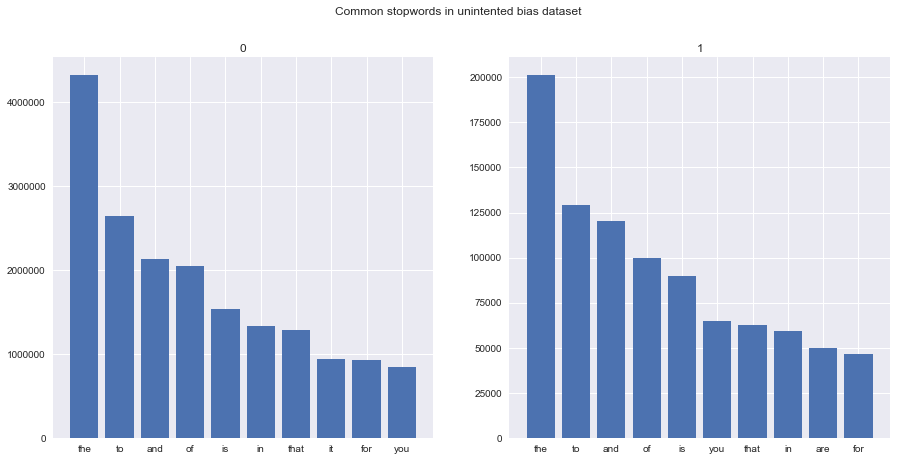

In [54]:
fig,ax = plt.subplots(1, 2, figsize=(15,7))

for i in range(2):
    new = train_1_df[train_1_df['toxic']== i]
    corpus_train = preprocess_comments(new, {})
    
    # defaultdict() - 인자로 주어진 객체의 기본값을 딕셔너리의 초기값으로 지정
    dic = defaultdict(int)        # 0이 default값으로 지정됨(value)
    for word in corpus_train:
        if word in stop:          # 단어가 stop(불용어 집합)에 해당할경우
            dic[word]+=1          # 단어의 값이 key가 되어 value값 +1
            
    # sorted() - key인자에 넘겨준 함수의 반환값을 비교하여 정렬된 리스트 생성
    top = sorted(dic.items(), key=lambda x:x[1],reverse=True)[:10]    # key에 넘겨준 함수의 반환값은 stop words의 개수
    x, y = zip(*top)  # zip() - 동일한 갯수의 요소값을 갖는 시퀀스 자료형을 묶어주는 역할
    ax[i].bar(x,y)
    ax[i].set_title(str(i))

fig.suptitle("Common stopwords in unintented bias dataset")

100%|███████████████████████████████████████████████████████████████████████████| 21384/21384 [00:26<00:00, 814.99it/s]


Text(0.5, 0.98, 'Common stopwords in toxicity dataset')

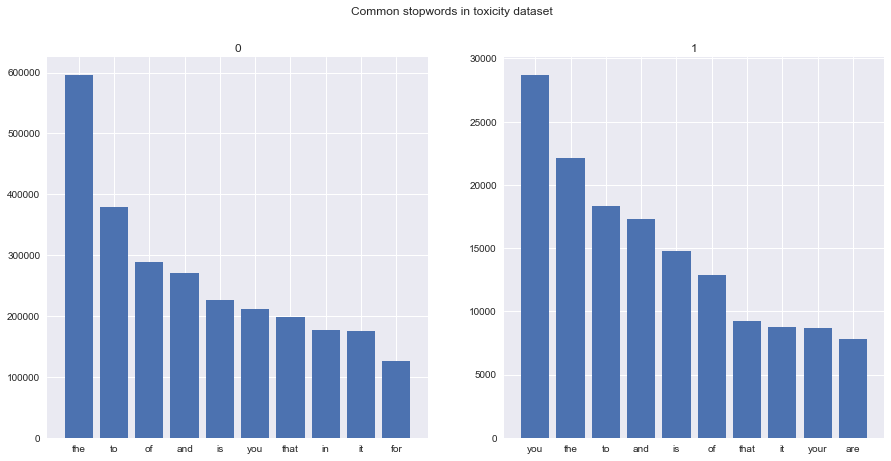

In [42]:
fig, ax = plt.subplots(1, 2, figsize=(15,7))

for i in range(2):
    new = train_2_df[train_2_df['toxic']== i]
    corpus_train_2 = preprocess_comments(new, {})
    
    dic = defaultdict(int)
    for word in corpus_train_2:
        if word in stop:
            dic[word]+=1
            
    top = sorted(dic.items(), key=lambda x:x[1],reverse=True)[:10] 
    x, y = zip(*top)
    ax[i].bar(x,y)
    ax[i].set_title(str(i))

fig.suptitle("Common stopwords in toxicity dataset")

### < Most common words >

Text(0.5, 0.98, 'Common words in toxicity dataset')

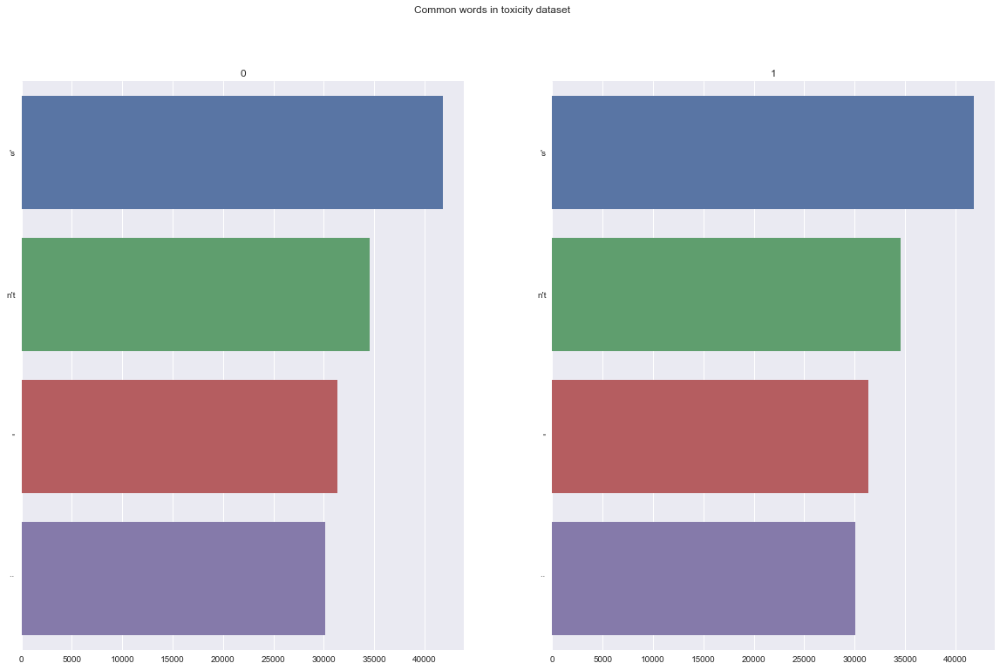

In [58]:
fig, ax = plt.subplots(1,2,figsize=(20,12))

for i in range(2):
    new = train_1_df[train_1_df['toxic']==i]   
    corpus = corpus_train
    counter = Counter(corpus)     # 라스트에 있는 단어의 개수를 셈
    most = counter.most_common()  # .most_common() : 데이터의 개수가 많은 순으로 정렬된 배열을 리턴
    x = []
    y = []
    
    for word,count in most[:20]:
        if (word not in stop) :
            x.append(word)
            y.append(count)
            
    sns.barplot(x=y, y=x, ax=ax[i])
    ax[i].set_title(str(i))
    
fig.suptitle("Common words in toxicity dataset")

100%|█████████████████████████████████████████████████████████████████████████| 202165/202165 [04:37<00:00, 729.09it/s]


Text(0.5, 0.98, 'Common words in unintended bias dataset')

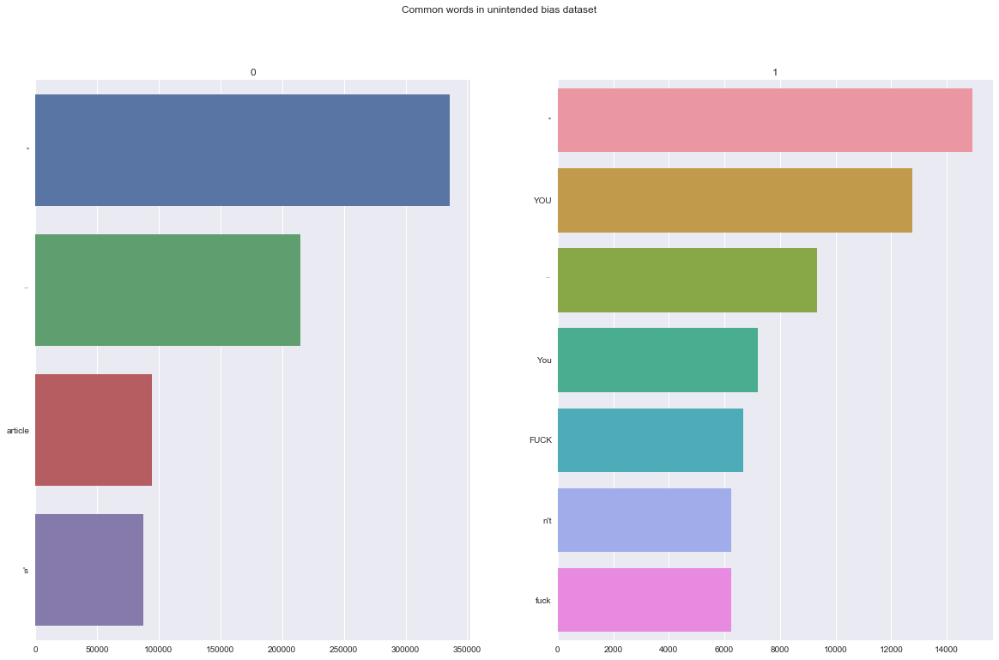

In [43]:
fig, ax = plt.subplots(1,2,figsize=(20,12))

for i in range(2):
    new = train_2_df[train_2_df['toxic']==i]  
    if i==0:
        corpus = preprocess_comments(new, {})
    else :
        corpus = corpus_train_2
    counter = Counter(corpus)
    most = counter.most_common()
    x = []
    y = []
    
    for word,count in most[:20]:
        if (word not in stop) :
            x.append(word)
            y.append(count)
            
    sns.barplot(x=y, y=x, ax=ax[i])
    ax[i].set_title(str(i))
    
fig.suptitle("Common words in unintended bias dataset")

### < Most common bi-grams >


n-gram은 n개의 연속적인 단어 나열을 의미


[Scikit-learn]CountVectorizer() : 문서 집합에서 단어 토큰을 생성하고 각 단어의 수를 세어 BOW 인코딩한 벡터를 만듬 ( Bag Of Words : 단어들의 출현빈도에 집중하는 수치화 표현방법 )


In [6]:
def get_top_ngram(corpus, n=None): 
    # 문서를 토큰 리스트로 변환 (ngram_range:n-그램 범위 (min, max), stop_words: 불용어 목록 받아 제외함)
    vec = CountVectorizer(ngram_range=(n, n),stop_words=stop).fit(corpus)
    # 토큰의 출현 빈도를 셈
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    
    
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq = sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:20]

Text(0.5, 0.98, 'Common bigrams in unintended bias dataset')

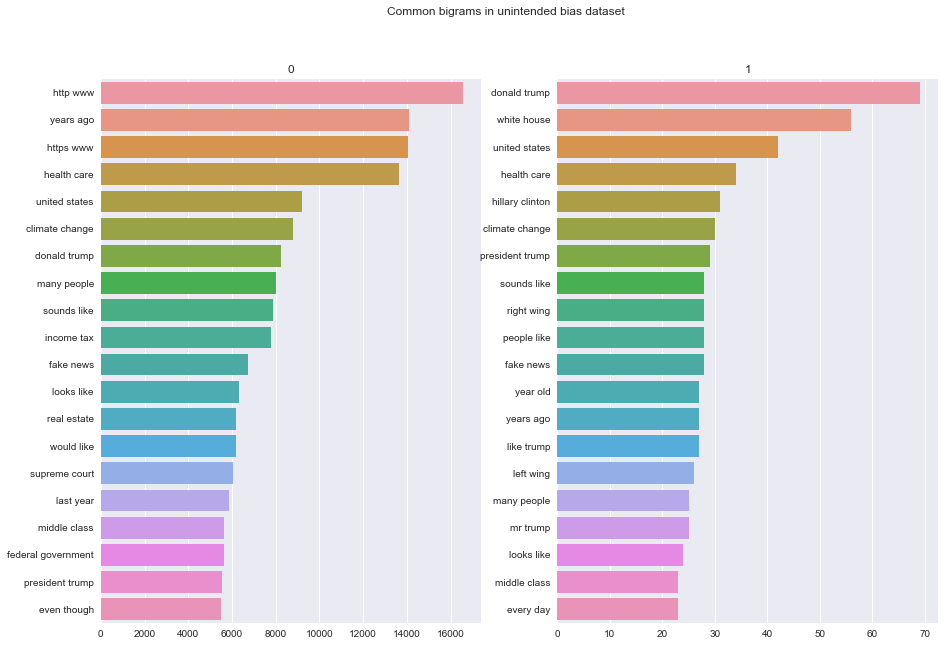

In [7]:
fig, ax = plt.subplots(1, 2, figsize=(15, 10))

for i in range(2):
    new = train_1_df[train_1_df['toxic'] == i]['comment_text']
    top_n_bigrams = get_top_ngram(new, 2)[:20] # n 인자를 2로 받음 -> bi-gram
    x, y = map(list, zip(*top_n_bigrams))
    sns.barplot(x=y, y=x, ax=ax[i])
    ax[i].set_title(str(i))
    
fig.suptitle('Common bigrams in unintended bias dataset')

Text(0.5, 0.98, 'Common bigrams in toxicity dataset')

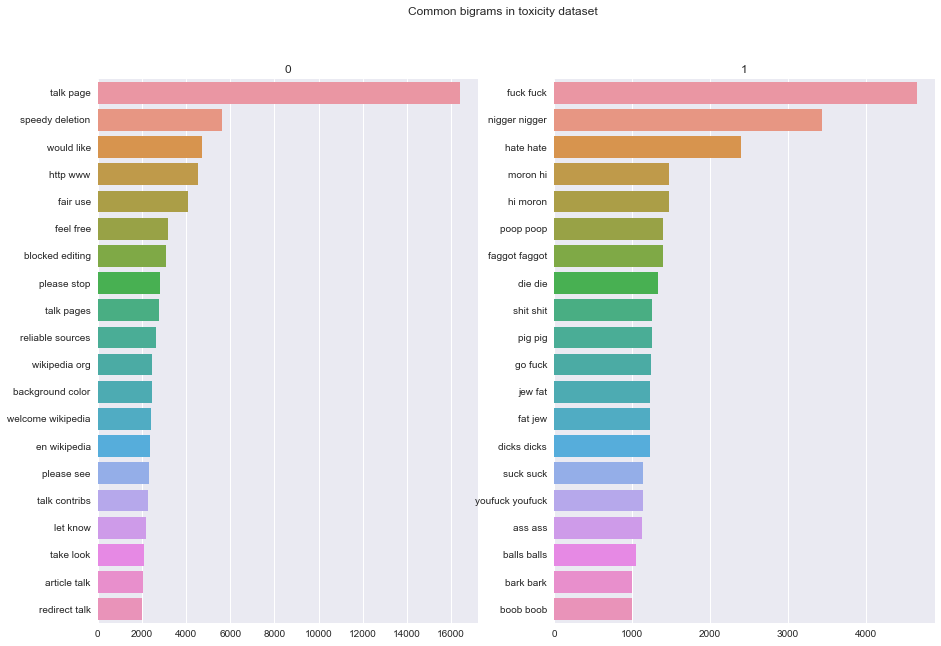

In [21]:
fig, ax = plt.subplots(1,2,figsize=(15,10))

for i in range(2):
    new = train_2_df[train_2_df['toxic'] == i]['comment_text']
    top_n_bigrams = get_top_ngram(new, 2)[:20]
    x, y = map(list,zip(*top_n_bigrams))
    sns.barplot(x=y,y=x,ax=ax[i])
    ax[i].set_title(str(i))
    
fig.suptitle("Common bigrams in toxicity dataset")

### < Wordcloud >

WordCloud 함수 내에서 자체적으로 빈도수를 계산하는 기능이 있음

In [14]:
stopwords = set(STOPWORDS)

def show_wordcloud(data, title = None,ax=None):
    wordcloud = WordCloud(
        background_color='white',
        stopwords=stopwords,
        max_words=100,
        max_font_size=30, 
        scale=3,
        random_state=1 
        )
    
    wordcloud = wordcloud.generate(str(data))
    ax.imshow(wordcloud,interpolation='nearest')
    ax.axis('off')

Text(0.5, 0.98, 'Wordcloud for toxicity dataset')

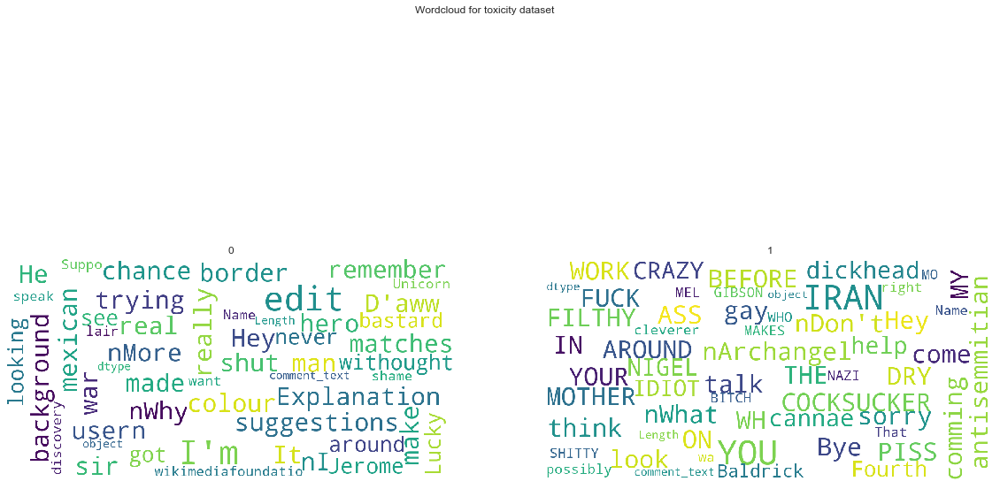

In [15]:
fig, ax = plt.subplots(1,2,figsize=(20,12))

for i in range(2):
    new = train_2_df[train_2_df['toxic'] == i]['comment_text']
    show_wordcloud(new, ax=ax[i])
    ax[i].set_title(str(i))
    
fig.suptitle('Wordcloud for toxicity dataset')

Text(0.5, 0.98, 'Wordcloud for unintended bias dataset')

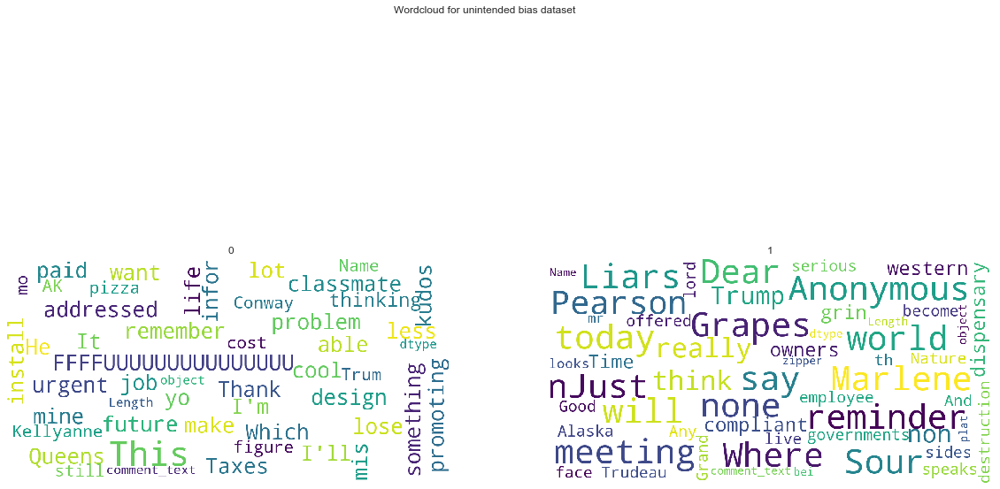

In [16]:
fig, ax = plt.subplots(1,2,figsize=(20,12))

for i in range(2):
    new = train_1_df[train_1_df['toxic'] == i]['comment_text']
    show_wordcloud(new, ax=ax[i])
    ax[i].set_title(str(i))
    
fig.suptitle('Wordcloud for unintended bias dataset')

### < Readability index (가독성) >

자연어 처리에서 가독성은 그 내용을 기반으로 판단되고, 그 내용은 필자가 각각의 문장이나 단락에 어떻게 단어를 사용하느냐에 달려있음.

- Flesch Reading Ease formula ( 가독성을 판단해주는 공식 )

![title](flesh.png)

높은 점수일수록 읽기 쉽다는 것을 의미함

90-100 - Very Easy

80-89 - Easy

70-79 - Fairly Easy

60-69 - Standard

50-59 - Fairly Difficult

30-49 - Difficult

0-29 - Very Confusing


#### 위의 공식에 따라 가독성을 판단하는 함수를 만들어보면,  ( textstat 라이브러리에 위 공식을 계산해주는 함수 존재 )

In [17]:
def plot_readability(a, b, title, bins=0.4):
    
    # Setting limits
    a = a[a >= 0]
    a = a[a <= 100]
    b = b[b >= 0]
    b = b[b <= 100]
    
    # ff.create_displot : 히스토그램과 연속 값을 혼합하여 플롯하는 방법
    trace1 = ff.create_distplot([a, b], ['non toxic', 'toxic'], bin_size=bins, show_rug=False)
    trace1['layout'].update(title=title)
    
    py.iplot(trace1, filename='Distplot')
    
    table_data= [["Statistical Measures","non toxic",'toxic'],
                 ["Mean",mean(a),mean(b)],
                 ["Standard Deviation",pstdev(a),pstdev(b)],
                 ["Variance",pvariance(a),pvariance(b)],
                 ["Median",median(a),median(b)],
                 ["Maximum value",max(a),max(b)],
                 ["Minimum value",min(a),min(b)]]
    
    trace2 = ff.create_table(table_data)
    py.iplot(trace2, filename='Table')

In [18]:
fre_non_toxic = np.array(train_1_df["comment_text"][train_1_df["toxic"].astype(int) == 0].sample(n=150000).apply(textstat.flesch_reading_ease))
fre_toxic = np.array(train_1_df["comment_text"][train_1_df["toxic"].astype(int) == 1].apply(textstat.flesch_reading_ease))

plot_readability(fre_non_toxic, fre_toxic, "Flesch Reading Ease - Unintended bias dataset", 1) 

In [19]:
fre_non_toxic = np.array(train_2_df['comment_text'][train_2_df['toxic'].astype(int) == 0].apply(textstat.flesch_reading_ease))
fre_toxic = np.array(train_2_df['comment_text'][train_2_df['toxic'].astype(int) == 1].apply(textstat.flesch_reading_ease))

plot_readability(fre_non_toxic, fre_toxic, "Flesch Reading Ease - Toxicity dataset", 1)

In [20]:
fre_non_toxic = np.array(validation_df['comment_text'][validation_df['toxic'].astype(int) == 0].apply(textstat.flesch_reading_ease))
fre_toxic = np.array(validation_df['comment_text'][validation_df['toxic'].astype(int) == 1].apply(textstat.flesch_reading_ease))

plot_readability(fre_non_toxic, fre_toxic, "Flesch Reading Ease - Validation set", 1)

전체적인 그래프 결과를 보았을때, toxic comment가 더 가독성이 높은 것을 볼 수 있음